## Quick eda notebook to look at the seasonality of the Dutch power consumption data

In [1]:
import numpy as np
import scipy as sp
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px

In [2]:
# Load and set index to datetime
df = pd.read_csv('../data/processed/NL_hourly_load_2006-2025.csv')
df['DateUTC'] = pd.to_datetime(df['DateUTC'])
df.set_index('DateUTC', inplace=True)

In [3]:
# Check for missing values
if df.isnull().sum().values[0] > 0:
    print(f"There are {df.isnull().sum().values[0]} missing values in the dataset. Linearly interpolating missing values.")
    # Interpolate NaN values to the mean of left and right values
    df['Load'] = df['Load'].interpolate(method='linear')

There are 10 missing values in the dataset. Linearly interpolating missing values.


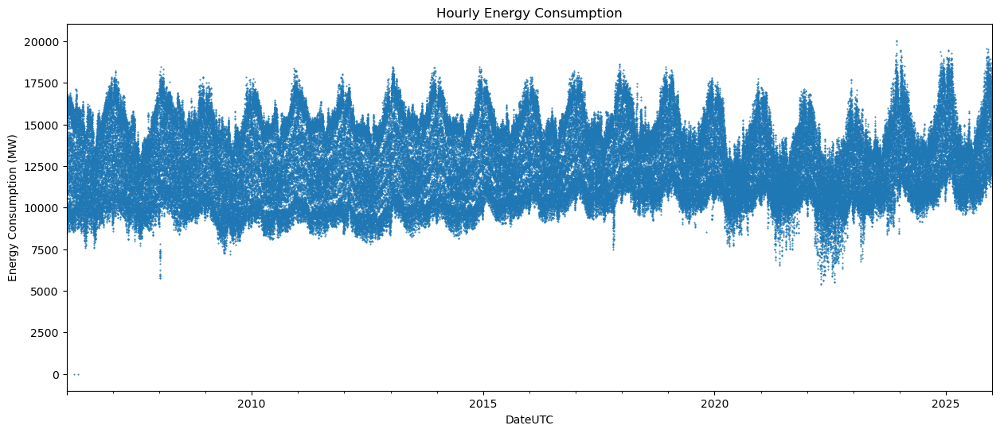

In [4]:
# Plot the hourly energy consumption
df['Load'].plot(style='.', figsize=(15, 6), title='Hourly Energy Consumption', markersize=1)
plt.ylabel('Energy Consumption (MW)')
plt.show()

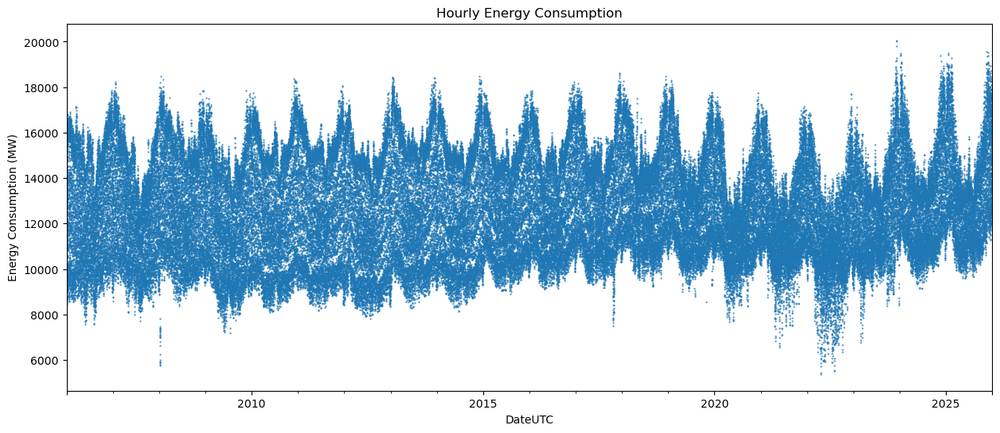

In [5]:
# Take out the obvious outliers using a rolling window of 1 week and a z-score threshold of 3
s = df['Load'].copy()
window = 24 * 7 # 1 week

rollingWindow = s.rolling(window=window, min_periods=1, center=True)
mean = rollingWindow.mean()
std = rollingWindow.std(ddof=0)
z = s.sub(mean).div(std)

m = z.between(-3, 3)
df['Load'] = s.where(m, np.nan).interpolate(method='linear')

# Plot the hourly energy consumption
df['Load'].plot(style='.', figsize=(15, 6), title='Hourly Energy Consumption', markersize=1)
plt.ylabel('Energy Consumption (MW)')
plt.show()

In [6]:
# # Take out the kind-of-obvious outliers by considering the difference between consecutive values and applying a z-score threshold of 3
# # Repeat 50 times to get rid of all outliers
# for i in range(1000):
#     s = df['Load'].copy()
#     diff = s.diff()
#     window = 24 * 7 # 1 week
#     rollingWindow = diff.rolling(window=window, min_periods=1, center=True)
#     mean = rollingWindow.mean()
#     std = rollingWindow.std(ddof=0)
#     z = diff.sub(mean).div(std)

#     m = z.between(-3, 3)
#     df['Load'] = df['Load'].where(m, np.nan).interpolate(method='linear')

# # Plot the hourly energy consumption
# df['Load'].plot(style='.', figsize=(15, 6), title='Hourly Energy Consumption', markersize=1)
# plt.ylabel('Energy Consumption (MW)')
# plt.show()

In [7]:
px.line(df, x=df.index, y='Load', title='Hourly Energy Consumption', labels={'Load': 'Energy Consumption (MW)'})

In [8]:
# Because the data pre-2015 is not standardised in time, let's ignore it for now and only use the data from 2015 onwards. We can always add the pre-2015 data later if we want to.
df = df[df.index >= '2015-01-01'].copy()

Average load: 12747.86 MW


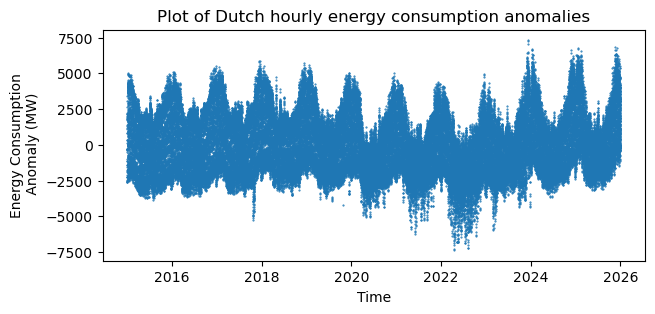

In [9]:
# Let's create a centered version of the data to make it easier to see the patterns in the data.
average_load = df['Load'].mean()
print(f"Average load: {average_load:.2f} MW")

df['LoadAnomaly'] = df['Load'].values - average_load
N = len(df['LoadAnomaly'])

plt.figure(figsize=(7, 3))
plt.plot(df['LoadAnomaly'], '.', markersize=1)
plt.xlabel('Time')
plt.ylabel('Energy Consumption\n Anomaly (MW)')
plt.title('Plot of Dutch hourly energy consumption anomalies')
plt.show()

In [10]:
# Let's add features that will make it easier to see the patterns in the data.
# First lets add seasonal features
df['HourOfDay'] = df.index.hour
df['DayOfWeek'] = df.index.dayofweek
df['MonthOfYear'] = df.index.month

df['Season'] = df['MonthOfYear'].apply(lambda x: (x%12 + 3)//3)  # 1: Spring, 2: Summer, 3: Autumn, 4: Winter

df['HoursSinceStart'] = df['DayOfWeek'] * 24 + df['HourOfDay']

In [11]:
(df['HoursSinceStart']).describe()

count    96432.000000
mean        83.500000
std         48.496815
min          0.000000
25%         41.750000
50%         83.500000
75%        125.250000
max        167.000000
Name: HoursSinceStart, dtype: float64

In [12]:
df['LoadAnomaly'].describe()

count    9.643200e+04
mean    -8.885191e-13
std      2.048728e+03
min     -7.364679e+03
25%     -1.651864e+03
50%     -1.819727e+02
75%      1.454136e+03
max      7.311779e+03
Name: LoadAnomaly, dtype: float64

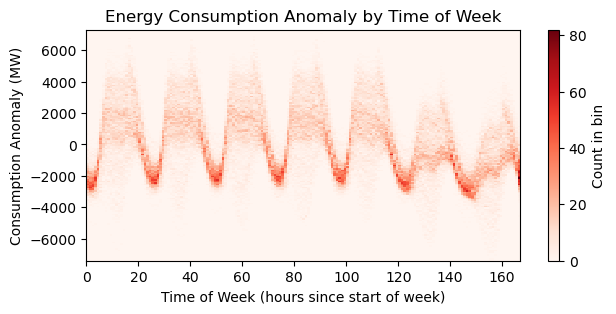

In [13]:
plt.figure(figsize=(7, 3))
plt.hist2d(df['HoursSinceStart'], df['LoadAnomaly'],
           bins=[np.arange(0,7*24,1), np.arange(-7400,7400,100)], cmap='Reds')
plt.colorbar(label='Count in bin')
plt.xlabel('Time of Week (hours since start of week)')
plt.ylabel('Consumption Anomaly (MW)')
plt.title('Energy Consumption Anomaly by Time of Week')
plt.show()

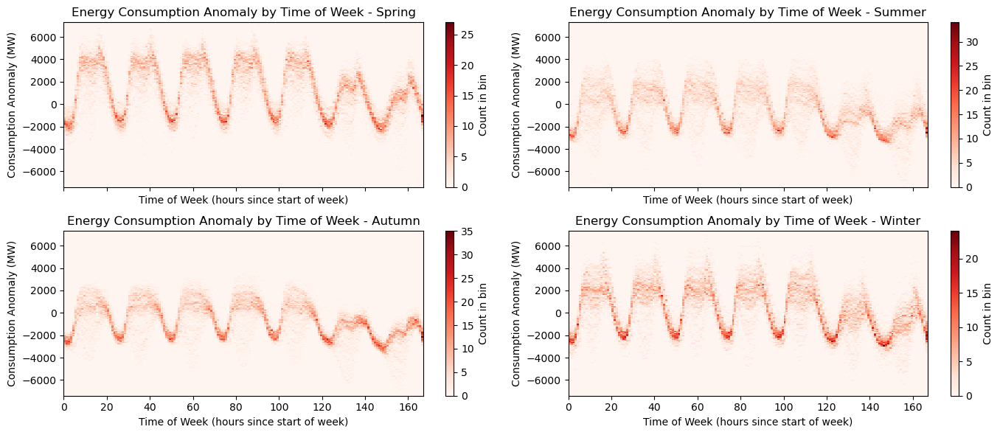

In [14]:
# Let's split this up by season to see if there are any differences in the patterns between seasons.

def plot_hist2d_by_season(axis, df_season, season_name):
    axis.hist2d(df_season['HoursSinceStart'], df_season['LoadAnomaly'],
                bins=[np.arange(0,7*24,1), np.arange(-7400,7400,100)], cmap='Reds')
    axis.set_xlabel('Time of Week (hours since start of week)')
    axis.set_ylabel('Consumption Anomaly (MW)')
    axis.set_title(f'Energy Consumption Anomaly by Time of Week - {season_name}')
    plt.colorbar(axis.collections[0], ax=axis, label='Count in bin')

fig, axs = plt.subplots(2, 2, figsize=(14, 6), sharex=True)
plot_hist2d_by_season(axs[0, 0], df[df['Season'] == 1], 'Spring')
plot_hist2d_by_season(axs[0, 1], df[df['Season'] == 2], 'Summer')
plot_hist2d_by_season(axs[1, 0], df[df['Season'] == 3], 'Autumn')
plot_hist2d_by_season(axs[1, 1], df[df['Season'] == 4], 'Winter')
plt.tight_layout()
plt.show()

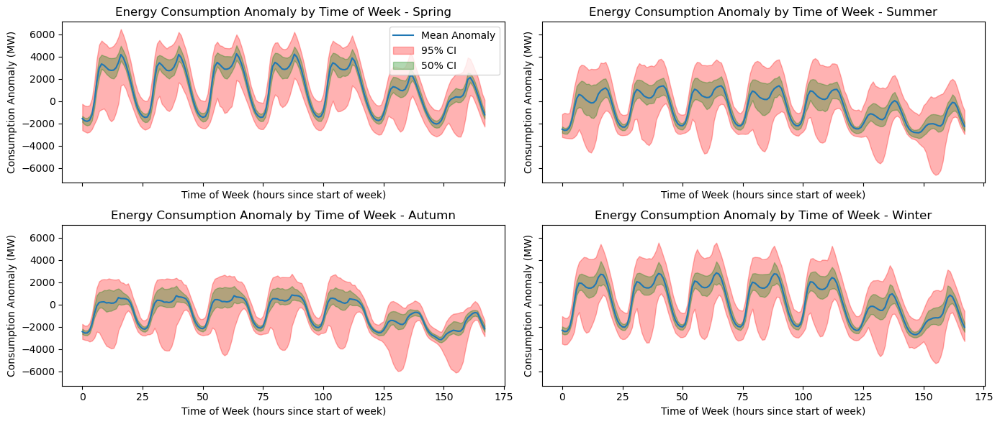

In [15]:
# Let's look at the the typical values per day during these seasons, and the confidence intervales around them
def plot_mean_and_ci_by_season(axis, df_season, season_name):
    grouped = df_season.groupby('HoursSinceStart')['LoadAnomaly']
    mean = grouped.mean()
    ci95_lower = grouped.apply(lambda x: np.percentile(x, 2.5))
    ci95_upper = grouped.apply(lambda x: np.percentile(x, 97.5))

    ci50_lower = grouped.apply(lambda x: np.percentile(x, 25))
    ci50_upper = grouped.apply(lambda x: np.percentile(x, 75))

    axis.plot(mean.index, mean.values, label='Mean Anomaly')
    axis.fill_between(mean.index, ci95_lower.values, ci95_upper.values, color='red', alpha=0.3, label='95% CI')
    axis.fill_between(mean.index, ci50_lower.values, ci50_upper.values, color='green', alpha=0.3, label='50% CI')
    axis.set_xlabel('Time of Week (hours since start of week)')
    axis.set_ylabel('Consumption Anomaly (MW)')
    axis.set_title(f'Energy Consumption Anomaly by Time of Week - {season_name}')
    

fig, axs = plt.subplots(2, 2, figsize=(14, 6), sharex=True, sharey=True)
plot_mean_and_ci_by_season(axs[0, 0], df[df['Season'] == 1], 'Spring')
plot_mean_and_ci_by_season(axs[0, 1], df[df['Season'] == 2], 'Summer')
plot_mean_and_ci_by_season(axs[1, 0], df[df['Season'] == 3], 'Autumn')
plot_mean_and_ci_by_season(axs[1, 1], df[df['Season'] == 4], 'Winter')
axs[0, 0].legend(loc='upper right')
plt.tight_layout()

In [16]:
#df.groupby(['Season', 'HoursSinceStart'])['LoadAnomaly'].mean().plot(figsize=(10, 5), title='Mean Energy Consumption Anomaly by Time of Week and Season')

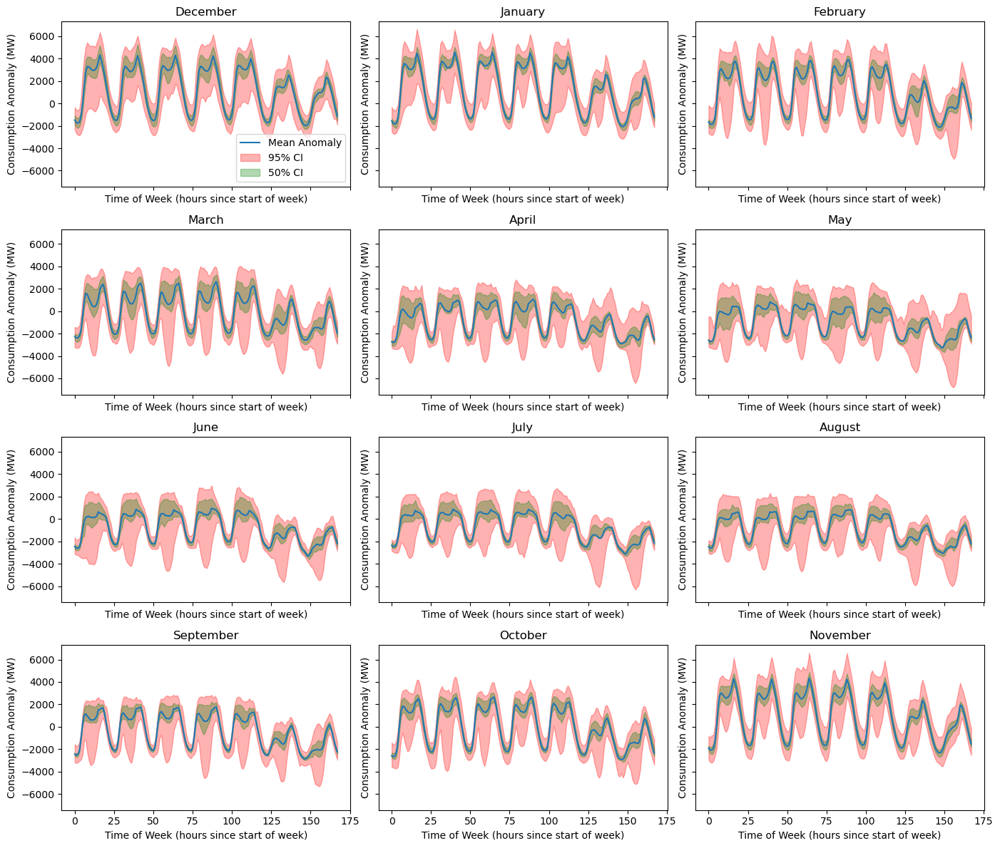

In [17]:
# Let's do this on a month by month basis to see if there are any differences in the patterns between months.
def plot_mean_and_ci_by_month(axis, df_month, month_name):
    grouped = df_month.groupby('HoursSinceStart')['LoadAnomaly']
    mean = grouped.mean()
    ci95_lower = grouped.apply(lambda x: np.percentile(x, 2.5))
    ci95_upper = grouped.apply(lambda x: np.percentile(x, 97.5))

    ci50_lower = grouped.apply(lambda x: np.percentile(x, 25))
    ci50_upper = grouped.apply(lambda x: np.percentile(x, 75))

    axis.plot(mean.index, mean.values, label='Mean Anomaly')
    axis.fill_between(mean.index, ci95_lower.values, ci95_upper.values, color='red', alpha=0.3, label='95% CI')
    axis.fill_between(mean.index, ci50_lower.values, ci50_upper.values, color='green', alpha=0.3, label='50% CI')
    axis.set_xlabel('Time of Week (hours since start of week)')
    axis.set_ylabel('Consumption Anomaly (MW)')
    axis.set_title(f'{month_name}')
    

fig, axs = plt.subplots(4, 3, figsize=(14, 12), sharex=True, sharey=True)
plot_mean_and_ci_by_month(axs[0, 0], df[df['MonthOfYear'] == 12], 'December')
plot_mean_and_ci_by_month(axs[0, 1], df[df['MonthOfYear'] == 1], 'January')
plot_mean_and_ci_by_month(axs[0, 2], df[df['MonthOfYear'] == 2], 'February')
plot_mean_and_ci_by_month(axs[1, 0], df[df['MonthOfYear'] == 3], 'March')
plot_mean_and_ci_by_month(axs[1, 1], df[df['MonthOfYear'] == 4], 'April')
plot_mean_and_ci_by_month(axs[1, 2], df[df['MonthOfYear'] == 5], 'May')
plot_mean_and_ci_by_month(axs[2, 0], df[df['MonthOfYear'] == 6], 'June')
plot_mean_and_ci_by_month(axs[2, 1], df[df['MonthOfYear'] == 7], 'July')
plot_mean_and_ci_by_month(axs[2, 2], df[df['MonthOfYear'] == 8], 'August')
plot_mean_and_ci_by_month(axs[3, 0], df[df['MonthOfYear'] == 9], 'September')
plot_mean_and_ci_by_month(axs[3, 1], df[df['MonthOfYear'] == 10], 'October')
plot_mean_and_ci_by_month(axs[3, 2], df[df['MonthOfYear'] == 11], 'November')
axs[0, 0].legend(loc='lower right')
plt.tight_layout()